In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sqlite3 as sql
import numpy as np
import warnings
from pandas.api.types import is_numeric_dtype
from datetime import datetime
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.compose import make_column_transformer, ColumnTransformer
from sklearn.linear_model import LinearRegression, Ridge, ElasticNet, Lasso 
from sklearn.model_selection import cross_val_score
from sklearn.impute import SimpleImputer
from sklearn.model_selection import GridSearchCV
from collections import OrderedDict
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor 
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.linear_model import ElasticNetCV, LassoCV, RidgeCV
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler, LabelEncoder, RobustScaler
from sklearn.compose import make_column_transformer, ColumnTransformer
from sklearn.linear_model import LinearRegression, Ridge, ElasticNet, Lasso 
from sklearn.model_selection import cross_val_score, KFold
from sklearn.impute import SimpleImputer
from sklearn.model_selection import GridSearchCV
from collections import OrderedDict
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor 
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.cluster import KMeans
from xgboost import XGBRegressor
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import KMeans
import scipy.stats as stats
import json
import requests

warnings.filterwarnings('ignore')

In [3]:
import importlib
import sys
import os
parent_dir = os.path.dirname(os.path.dirname(os.path.abspath('')))

print(parent_dir)
sys.path.insert(0,parent_dir)
import data_manipulation.data_transform as dat

importlib.reload(dat)

/home/cody/Documents/DataSciBC/EPLTransfer


<module 'data_manipulation.data_transform' from '/home/cody/Documents/DataSciBC/EPLTransfer/data_manipulation/data_transform.py'>

In [4]:
main_data_path = "../../data/main_data/train/train.csv"
train = pd.read_csv(main_data_path)
train

,name,dob,pos,height,foot,date,market_value,minutesPlayed,totalLongBalls,keyPass,...,red_card,rating,accuratePass,accurateLongBalls,accurateCross,accurateKeeperSweeper,expectedAssists,expectedGoals,xGChain,xGBuildup
0,luiz henrique,2001-01-01,M,182.0,left,2024-01-27,12000000.0,2435,32,28,...,0.0,6.770213,11.382979,0.361702,0.340426,0.00,0.075784,0.095309,0.265086,0.102528
1,adilson goiano,1988-02-08,M,180.0,right,2017-05-21,1000000.0,2945,95,16,...,0.0,6.625000,14.727273,1.204545,0.000000,0.00,0.000000,0.000000,0.000000,0.000000
2,mathias de amorim,2004-12-09,M,178.0,right,2024-09-14,200000.0,20,2,0,...,0.0,6.600000,8.000000,2.000000,0.000000,0.00,0.009056,0.000000,0.000000,0.000000
3,luis rioja,1993-10-15,M,173.0,left,2024-10-21,4000000.0,10138,201,123,...,0.0,6.649660,12.346939,0.496599,0.755102,0.00,0.099794,0.091884,0.225306,0.110556
4,brecht capon,1988-04-21,D,179.0,right,2023-04-15,100000.0,3764,277,20,...,0.0,6.449123,18.052632,1.631579,0.210526,0.00,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8727,kingsley fobi,1998-09-19,D,180.0,right,2020-11-08,100000.0,45,0,0,...,0.0,6.700000,4.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000
8728,josef bursik,2000-07-11,G,187.0,left,2022-11-05,2000000.0,4500,861,2,...,0.0,6.730000,17.360000,6.120000,0.000000,0.32,0.000000,0.000000,0.000000,0.000000
8729,julián malatini,2001-05-30,D,191.0,right,2024-10-20,2500000.0,904,53,4,...,0.0,5.987500,28.875000,1.062500,0.125000,0.00,0.019134,0.070769,0.173909,0.113813
8730,antoine devaux,1985-02-20,M,185.0,right,2016-05-14,1000000.0,2819,97,20,...,3.0,6.930303,34.212121,1.666667,0.242424,0.00,0.033041,0.065410,0.214641,0.148663


In [5]:
train.columns

Index(['name', 'dob', 'pos', 'height', 'foot', 'date', 'market_value',
       'minutesPlayed', 'totalLongBalls', 'keyPass', 'totalPass', 'totalCross',
       'goalAssist', 'savedShotsFromInsideTheBox', 'saves',
       'totalKeeperSweeper', 'goalsPrevented', 'touches', 'possessionLostCtrl',
       'dispossessed', 'aerialLost', 'aerialWon', 'duelLost', 'duelWon',
       'challengeLost', 'outfielderBlock', 'totalContest', 'interceptionWon',
       'wonContest', 'totalTackle', 'totalClearance', 'blockedScoringAttempt',
       'hitWoodwork', 'bigChanceCreated', 'bigChanceMissed', 'shotOffTarget',
       'onTargetScoringAttempt', 'goals', 'wasFouled', 'fouls', 'totalOffside',
       'yellow_card', 'red_card', 'rating', 'accuratePass',
       'accurateLongBalls', 'accurateCross', 'accurateKeeperSweeper',
       'expectedAssists', 'expectedGoals', 'xGChain', 'xGBuildup'],
      dtype='object')

In [6]:
train = dat.transformer(train).data

In [7]:
train

,name,dob,pos,height,foot,date,market_value,minutesPlayed,totalLongBalls,keyPass,...,rating,accuratePass,accurateLongBalls,accurateCross,accurateKeeperSweeper,expectedAssists,expectedGoals,xGChain,xGBuildup,age
0,luiz henrique,2001-01-01,M,182.0,left,2024-01-27,16.300417,2435,32,28,...,6.770213,11.382979,0.361702,0.340426,0.00,0.075784,0.095309,0.265086,0.102528,23.0
1,adilson goiano,1988-02-08,M,180.0,right,2017-05-21,13.815512,2945,95,16,...,6.625000,14.727273,1.204545,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,29.0
2,mathias de amorim,2004-12-09,M,178.0,right,2024-09-14,12.206078,20,2,0,...,6.600000,8.000000,2.000000,0.000000,0.00,0.009056,0.000000,0.000000,0.000000,19.0
3,luis rioja,1993-10-15,M,173.0,left,2024-10-21,15.201805,10138,201,123,...,6.649660,12.346939,0.496599,0.755102,0.00,0.099794,0.091884,0.225306,0.110556,31.0
4,brecht capon,1988-04-21,D,179.0,right,2023-04-15,11.512935,3764,277,20,...,6.449123,18.052632,1.631579,0.210526,0.00,0.000000,0.000000,0.000000,0.000000,35.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8727,kingsley fobi,1998-09-19,D,180.0,right,2020-11-08,11.512935,45,0,0,...,6.700000,4.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,22.0
8728,josef bursik,2000-07-11,G,187.0,left,2022-11-05,14.508658,4500,861,2,...,6.730000,17.360000,6.120000,0.000000,0.32,0.000000,0.000000,0.000000,0.000000,22.0
8729,julián malatini,2001-05-30,D,191.0,right,2024-10-20,14.731802,904,53,4,...,5.987500,28.875000,1.062500,0.125000,0.00,0.019134,0.070769,0.173909,0.113813,23.0
8730,antoine devaux,1985-02-20,M,185.0,right,2016-05-14,13.815512,2819,97,20,...,6.930303,34.212121,1.666667,0.242424,0.00,0.033041,0.065410,0.214641,0.148663,31.0


# Target Exploration and Distribution

In [8]:
target = 'market_value'

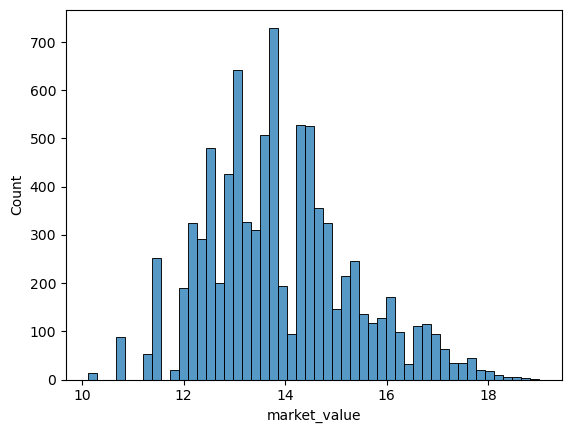

In [9]:
sns.histplot(train,x=target)
plt.show()

In [10]:
# Skewness and Kurtosis
print(f'Skewness: {train[target].skew()}')
print(f'Kurtosis: {train[target].kurt()}')

Skewness: 0.4681963894602055
Kurtosis: 0.052160574545701


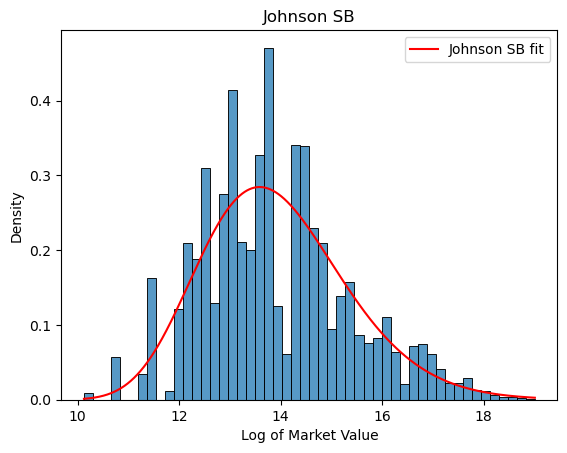

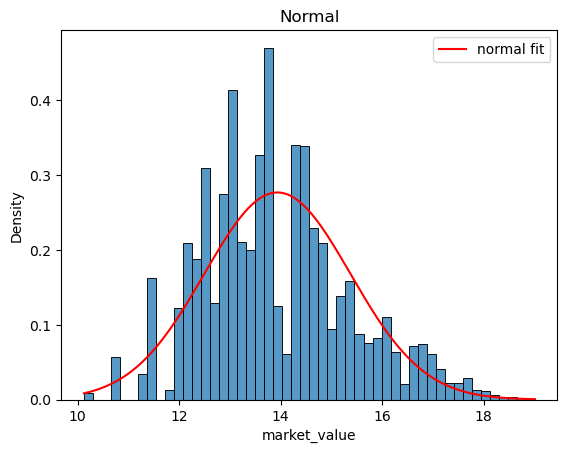

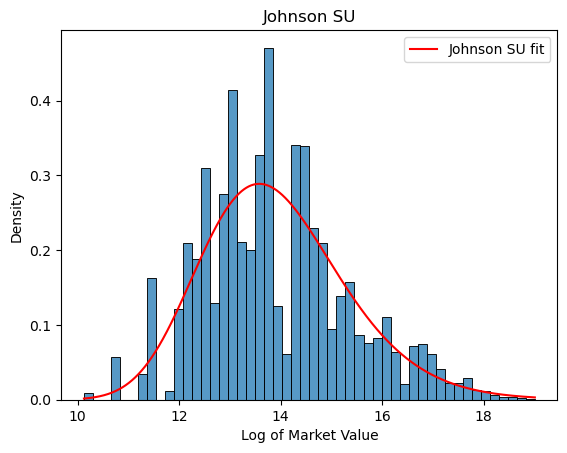

In [11]:
target_col = train[target]
x=np.linspace(min(target_col),max(target_col),100000)
plt.figure(1)
plt.title('Johnson SB')
plt.xlabel('Log of Market Value')
sns.histplot(data=train,x=target,stat='density')
john = stats.johnsonsb.fit(target_col)
plt.plot(x,stats.johnsonsb.pdf(x,*john),'r-',label='Johnson SB fit')
plt.legend()

plt.figure(2)
plt.title('Normal')
sns.histplot(data=train,x=target,stat='density')
mu,std = stats.norm.fit(target_col)
plt.plot(x,stats.norm.pdf(x,mu,std),'r-',label='normal fit')
plt.legend()

plt.figure(3)
plt.title('Johnson SU')
plt.xlabel('Log of Market Value')
sns.histplot(data=train,x=target,stat='density')
john = stats.johnsonsu.fit(target_col)
plt.plot(x,stats.johnsonsu.pdf(x,*john),'r-',label='Johnson SU fit')
plt.legend()
plt.show()

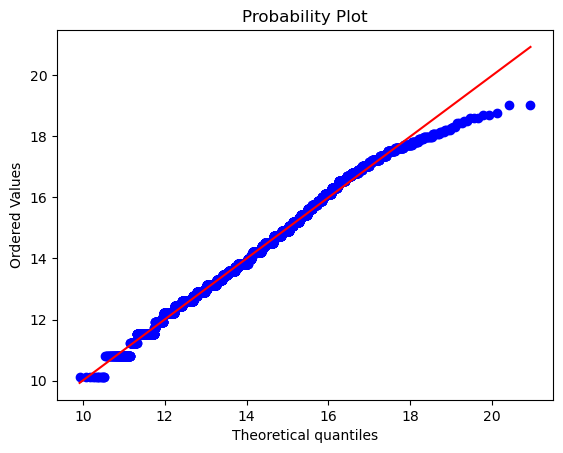

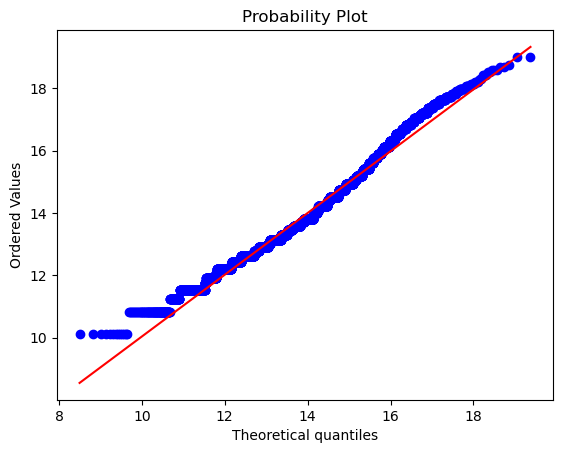

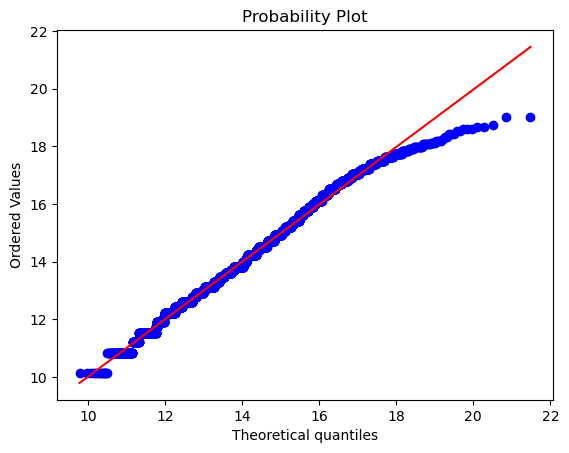

In [12]:
# QQ plot
plt.figure(1)
plt.title('Johnson SB')
john = stats.johnsonsb.fit(target_col)
stats.probplot(target_col,dist=stats.johnsonsb,sparams=john,plot=plt)

plt.figure(2)
plt.title('Normal')
norm_fit = stats.norm.fit(target_col)
stats.probplot(target_col,dist=stats.norm,sparams=norm_fit,plot=plt)

plt.figure(3)
plt.title('Johnson SU')
john = stats.johnsonsu.fit(target_col)
stats.probplot(target_col,dist=stats.johnsonsu,sparams=john,plot=plt)
plt.show()

When just taking the log of the target variables, we see that it is pretty close to normal or Johnson $S_B$ distribution, but it does have some skewness and kurtosis, which tells me that the Johnson $S_B$ distribution will probability be better.
One interesting thing is that dividing by 1million and then taking the log, gets us something that is very skewed.  

In [13]:
print(f"mean: {target_col.mean()}")
print(f"std: {target_col.std()}")
print(f"skewness: {target_col.skew()}")
print(f"Kurtosis: {target_col.kurt()}")
a,b,loc,scale = stats.johnsonsb.fit(target_col)
print(a,b,loc,scale)

mean: 13.93714873595595
std: 1.4407083636086322
skewness: 0.4681963894602055
Kurtosis: 0.052160574545701
7.229754413863311 4.217102285697491 6.742802480750116 46.38453532694679


In [14]:
# Lets get quantiative columns:
def getNumericColumns(data):
    quantiative = [f for f in data.columns if data.dtypes[f] !='object']
    return quantiative
quant_f = getNumericColumns(train)
quant_f.remove('date')
quant_f.remove('dob')
quant_f


['height',
 'market_value',
 'minutesPlayed',
 'totalLongBalls',
 'keyPass',
 'totalPass',
 'totalCross',
 'goalAssist',
 'savedShotsFromInsideTheBox',
 'saves',
 'totalKeeperSweeper',
 'goalsPrevented',
 'touches',
 'possessionLostCtrl',
 'dispossessed',
 'aerialLost',
 'aerialWon',
 'duelLost',
 'duelWon',
 'challengeLost',
 'outfielderBlock',
 'totalContest',
 'interceptionWon',
 'wonContest',
 'totalTackle',
 'totalClearance',
 'blockedScoringAttempt',
 'hitWoodwork',
 'bigChanceCreated',
 'bigChanceMissed',
 'shotOffTarget',
 'onTargetScoringAttempt',
 'goals',
 'wasFouled',
 'fouls',
 'totalOffside',
 'yellow_card',
 'red_card',
 'rating',
 'accuratePass',
 'accurateLongBalls',
 'accurateCross',
 'accurateKeeperSweeper',
 'expectedAssists',
 'expectedGoals',
 'xGChain',
 'xGBuildup',
 'age']

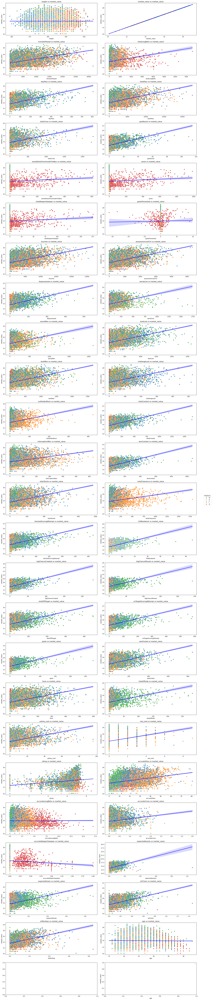

In [18]:
fig,axes = plt.subplots(ncols=2,nrows = int(len(quant_f)/2)+1,figsize=(20,100))
axes = axes.flatten()

for i, gs in enumerate(quant_f):
    
    sns.scatterplot(data=train,x=gs,y=target,hue='pos',ax=axes[i])
    sns.regplot(data=train,x=gs,y=target,scatter=False,ax=axes[i],color='blue')
    axes[i].set_title(f'{gs} vs market_value')
    axes[i].legend().remove()
    plt.xlabel(gs)
    plt.ylabel('market_value')

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='center left', bbox_to_anchor=(1.02, 0.5), title='Positions')
plt.tight_layout()
plt.legend()
plt.show()

In [ ]:
# As we can see, certain stats are only important to goalkeepers, which we will need to extract our just for them.  

In [15]:
#normality test
stat , p=stats.shapiro(train[quant_f])
print(f'Statistics = {stat}, p={p}')
alpha = 0.05
if p<alpha:
    print(f'Sample looks Gaussian (fail to reject H0)')
else:
    print(f'Sample does not look Gaussian (reject H0)')

Statistics = 0.17977699600167185, p=2.743656273002645e-214
Sample looks Gaussian (fail to reject H0)


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

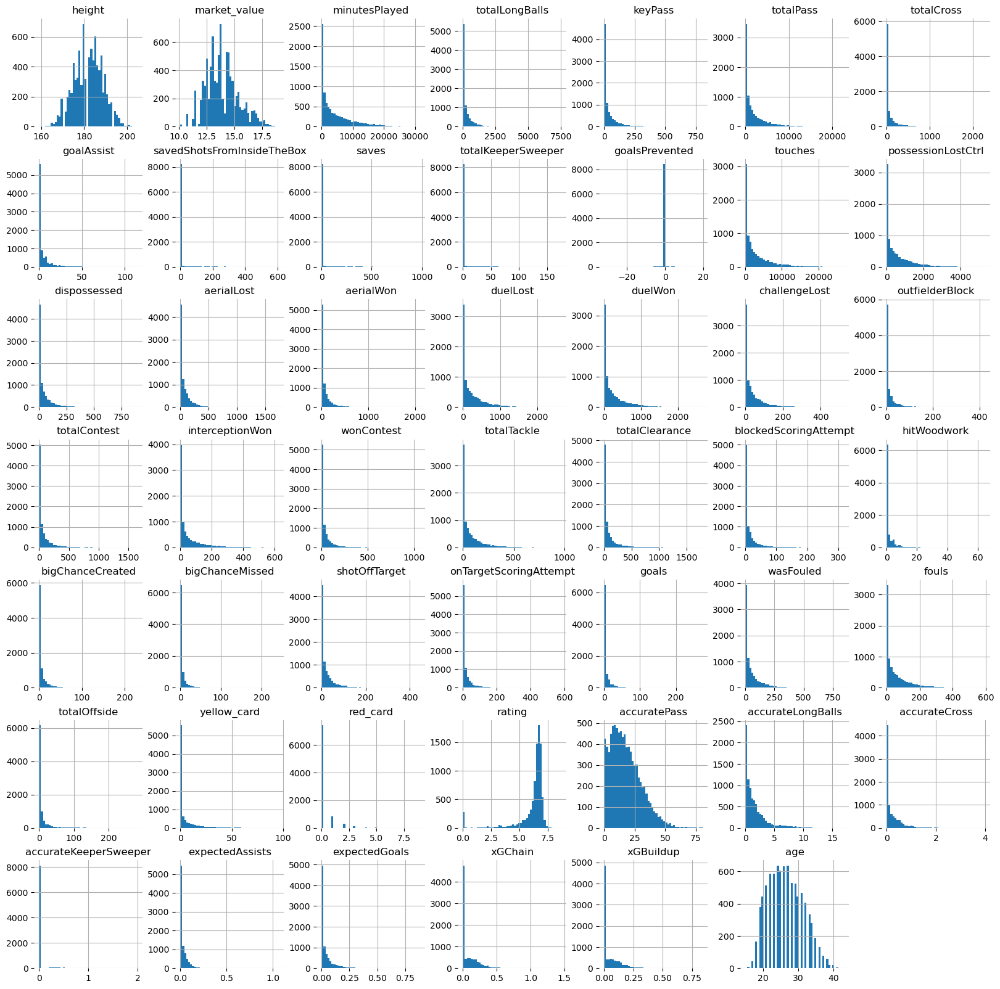

In [16]:
df = train[quant_f]
h = df.hist(bins=50,figsize=(20,20),xlabelsize='10',ylabelsize='10',xrot=-.15)
sns.despine(left=True,bottom=True)
[x.title.set_size(12) for x in h.ravel()]
[x.yaxis.tick_left() for x in h.ravel()]

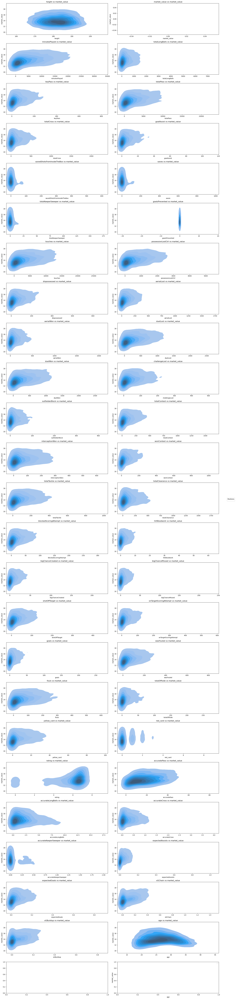

In [18]:
fig,axes = plt.subplots(ncols=2,nrows = int(len(quant_f)/2)+1,figsize=(20,90))
axes = axes.flatten()

for i, gs in enumerate(quant_f):
    
    sns.kdeplot(data=train,x=gs,y=target,fill=True,ax=axes[i])
    axes[i].set_title(f'{gs} vs market_value')
    axes[i].legend().remove()
    plt.xlabel(gs)
    plt.ylabel('market_value')

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='center left', bbox_to_anchor=(1.02, 0.5), title='Positions')
plt.tight_layout()
plt.legend()
plt.show()

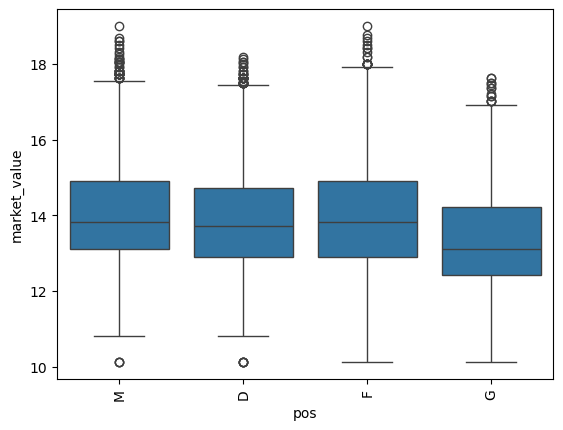

In [20]:

#df=scaled
plt.figure(1)

sns.boxplot(x=train['pos'],y=df[target])
plt.xticks(rotation=90)




plt.show()

<Axes: title={'center': 'Pearson Correlation Matrix'}>

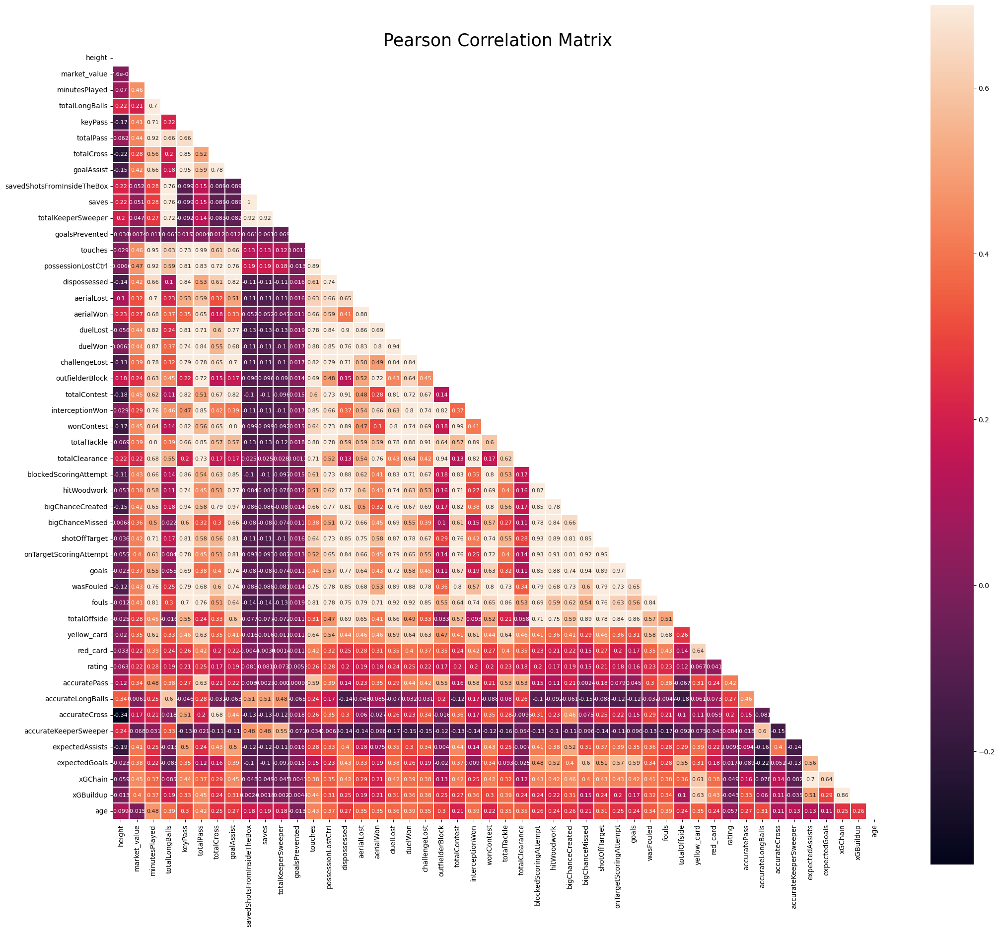

In [21]:
features = quant_f
mask = np.zeros_like(train[features].corr(),dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

f,ax = plt.subplots(figsize=(25,25))
plt.title('Pearson Correlation Matrix',fontsize=25)

sns.heatmap(train[features].corr(),linewidths=0.25,vmax=0.7,square=True,linecolor='w',annot=True,annot_kws={'size':8},
            mask=mask,cbar_kws={'shrink':.9})